In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
%load_ext autoreload
%autoreload 2

In [2]:
from tqdm.notebook import tnrange, tqdm
from jax import random, vmap, jit, value_and_grad
from jax.experimental import optimizers, stax
import staxplusplus as spp
from normalizing_flows import *
import matplotlib.pyplot as plt
from datasets import *
from jax.flatten_util import ravel_pytree
ravel_pytree = jit(ravel_pytree)
import jax.numpy as np
from jax.tree_util import tree_map
from collections import namedtuple
import matplotlib.image

In [3]:
from datasets import get_celeb_dataset

In [4]:
quantize_level_bits = 3
x_train = get_celeb_dataset(quantize_level_bits=quantize_level_bits, strides=(2, 2), crop=(0, 0), n_images=50000)
x_train = x_train[:,26:-19,12:-13]

# x_train = get_celeb_dataset(quantize_level_bits=quantize_level_bits, strides=(5, 5), crop=(12, 4), n_images=50000)
# train_labels = None
# x_train = get_celeb_dataset(quantize_level_bits=quantize_level_bits, strides=(2, 2), crop=(29, 9), n_images=50000)


# x_train, y_train, x_test, y_test = get_cifar10_data(quantize_level_bits=quantize_level_bits)
x_train.shape

202599


(50000, 64, 64, 3)

In [5]:
# train_images, train_labels, test_images, test_labels = get_mnist_data(quantize_level_bits, kind='fashion')
# x_train = train_images[:,:,:,0]
# x_train.shape

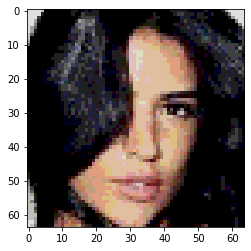

In [6]:
plt.imshow(x_train[1]/(2.0**quantize_level_bits))

# Build the RealNVP Model

In [60]:
import jax.nn.initializers as jaxinit

def AffineCoupling1D(out_shape, n_hidden_layers=1, layer_size=128):
    dense_layers = [spp.Dense(layer_size), spp.Relu()]*n_hidden_layers
    return spp.sequential(*dense_layers,
                          spp.Dense(out_shape[-1]*2),
                          spp.Split(2, axis=-1), 
                          spp.parallel(spp.Tanh(), spp.Identity())) # log_s, t

def AdditiveCoupling1D(out_shape, n_hidden_layers=4, layer_size=1024):
    dense_layers = [spp.Dense(layer_size), spp.Relu()]*n_hidden_layers
    return spp.sequential(*dense_layers, spp.Dense(out_shape[-1]))

def NeuralSplineTransform(out_shape, n_hidden_layers=2, layer_size=256):
    dense_layers = [spp.Dense(layer_size), spp.Relu()]*n_hidden_layers
    return spp.sequential(*dense_layers, spp.Dense(np.prod(out_shape)), spp.Reshape(out_shape))

def GLOW(name_iter, n_repeats=8, filter_shape=(1, 1), dilation=(1, 1), n_channels=512, ratio=2):
    layers = [ResidualGLOW(filter_shape=filter_shape, dilation=dilation, n_channels=n_channels, ratio=ratio, name=next(name_iter))]*n_repeats
    return sequential_flow(*layers)
    
def RealNDP(z_dim=50):
    debug_kwargs = dict(print_init_shape=True, print_forward_shape=False, print_inverse_shape=False, compare_vals=False)
    
    an_names = iter(['act_norm_%d'%i for i in range(100)])
    name_iter = iter(['glow_%d'%i for i in range(100)])
    
    def multi_scale(flow, filter_shape=(1, 1), dilation=(1, 1), n_channels=512, ratio=2):
        return sequential_flow(GLOW(name_iter, filter_shape=filter_shape, dilation=dilation, n_channels=n_channels, ratio=ratio),
                               Debug('multiscale'),
                               Squeeze(),
                               FactorOut(2),
                               factored_flow(flow, Identity()),
                               FanInConcat(2),
                               UnSqueeze())
    
    if(z_dim is not None):
        
        glow = lambda n_repeats: GLOW(name_iter, n_repeats, filter_shape=(1, 1), dilation=(1, 1), n_channels=512, ratio=2)
        
        def get_prior():
            prior_layers = [AffineCoupling(AffineCoupling1D), ActNorm(name=next(an_names)), Reverse()]*7
            return sequential_flow(TallAffineDiagCov(Identity(), z_dim), *prior_layers)
        
        flow = sequential_flow(Debug('a'),
                               UpSample((2, 2), name='upsample'))
#                                named_wrap(FilledCoupledUpsample(), name='upsample'))
        
#         flow = multi_scale(multi_scale(multi_scale(multi_scale(multi_scale(glow(1))))))

#         prior_flow = UnitGaussianPrior()
#         prior_flow = sequential_flow(get_prior(), UnitGaussianPrior())
        layers = [AffineCoupling(AffineCoupling1D), ActNorm(name=next(an_names)), Reverse()]*1
        prior_flow = sequential_flow(*layers)
#         prior_flow = named_wrap(prior_flow, name='prior_flow')
    else:
        flow = Identity()

#         flow = GLOW(name_iter, filter_shape=(1, 1), dilation=(1, 1), n_channels=512, ratio=2)
#         flow = multi_scale(flow, filter_shape=(1, 1), dilation=(1, 1), n_channels=512, ratio=2)
#         flow = multi_scale(flow, filter_shape=(1, 1), dilation=(1, 1), n_channels=512, ratio=2)
        prior_flow = UnitGaussianPrior()
    
    flow = sequential_flow(Dequantization(scale=2**quantize_level_bits), 
                           Logit(lmbda=0.05), 
                           flow,
                           Flatten(),
                           prior_flow)
    
    return flow

# Initialize the model

In [61]:
nif = RealNDP(2)
init_fun, forward, inverse = nif

key = random.PRNGKey(0)
names, output_shape, params, state = init_fun(key, x_train.shape[1:], ())
output_shape

a input_shape (64, 64, 3)


(3072,)

In [62]:
ravel_pytree(params)[0].shape

(623744,)

In [63]:
nf, nif = RealNDP(None), RealNDP(2)
Model = namedtuple('model', 'names output_shape params state forward inverse')

models = []
for flow in [nf, nif]:
    init_fun, forward, inverse = flow

    key = random.PRNGKey(0)
    names, output_shape, params, state = init_fun(key, x_train.shape[1:], ())
    z_dim = output_shape[-1]
    n_params = ravel_pytree(params)[0].shape[0]
    print('output_shape', output_shape, 'n_params', n_params)

    flow_model = ((names, output_shape, params, state), forward, inverse)
    
    actnorm_names = [name for name in tree_flatten(names)[0] if 'act_norm' in name]

    params = multistep_flow_data_dependent_init(x_train,
                                       actnorm_names,
                                       flow_model,
                                       (),
                                       'actnorm_seed',
                                       key,
                                       n_seed_examples=15000,
                                       batch_size=64,
                                       notebook=True)
    
    models.append(Model(names, output_shape, params, state, forward, inverse))
nf_model, nif_model = models

output_shape (12288,) n_params 0



a input_shape (64, 64, 3)
output_shape (3072,) n_params 623744


# Add pretrain capabilities

In [64]:
def pretrainer(names, params, state, target_name=None):
    original_params = params
    flat_names, treedef = tree_flatten(names)
    
    if(target_name is None):
        return params, lambda x: x
    
    mapped_params = treedef.flatten_up_to(params)
    sub_params = mapped_params[flat_names.index(target_name)]

    @jit
    def pretrain_swap(sub_params):
        # Replace the sub params in the original params list
        mapped_params = treedef.flatten_up_to(params)
        old_param = mapped_params[flat_names.index(target_name)]

        # Replace the parameter
        mapped_params[flat_names.index(target_name)] = sub_params
        updated_params = treedef.unflatten(mapped_params)
        return updated_params
    
    return sub_params, pretrain_swap

In [65]:
nif_sub_params, nif_pretrain_swap = pretrainer(nif_model.names, nif_model.params, nif_model.state, None)
nf_sub_params, nf_pretrain_swap = pretrainer(nf_model.names, nf_model.params, nf_model.state, None)

# Create new models
nif_model = Model(nif_model.names, nif_model.output_shape, nif_sub_params, nif_model.state, nif_model.forward, nif_model.inverse)
nf_model = Model(nf_model.names, nf_model.output_shape, nf_sub_params, nf_model.state, nf_model.forward, nf_model.inverse)

In [66]:
len(nif_model.params)

5

# Create the loss function and optimizer

In [67]:
@partial(jit, static_argnums=(0, 1))
def nll(pretrain_swap, forward, params, state, x, **kwargs):
    # If we are training a subnetwork first, then we need to fill in the full parameters first
    params = pretrain_swap(params)
    
    log_px, z, updated_state = forward(params, state, np.zeros(x.shape[0]), x, (), **kwargs)
    return -np.mean(log_px), updated_state

In [68]:
@partial(pmap, static_broadcasted_argnums=(0, 1, 2, 3), axis_name='batch')
def spmd_update(pretrain_swap, forward, opt_update, get_params, i, opt_state, state, x_batch, key):
    params = get_params(opt_state)
    (val, state), grads = jax.value_and_grad(partial(nll, pretrain_swap, forward), has_aux=True)(params, state, x_batch, key=key, test=TRAIN)
    g = jax.lax.psum(grads, 'batch')
    opt_state = opt_update(i, g, opt_state)
    return val, state, opt_state

In [69]:
import subprocess

def get_fid_score(nf_model, nif_model, key, n_samples=12000, n_samples_per_batch=64):
    
    nf_fid_folder = 'FID/nf_fid_folder/'
    nif_fid_folder = 'FID/nif_fid_folder/'
    stats_folder = 'FID/'
#     stats_name = 'fid_stats_cifar10_train.npz'
    stats_name = 'fid_stats_celeba.npz'

    if(path.exists(stats_folder) == False):
        os.makedirs(stats_folder)
    if(path.exists(nf_fid_folder) == False):
        os.makedirs(nf_fid_folder)
    if(path.exists(nif_fid_folder) == False):
        os.makedirs(nif_fid_folder)
        
    # Generate the samples from the noisy injective flow
    zs = random.normal(key, (n_samples, z_dim))
    for j in range(n_samples//n_samples_per_batch):
        z = zs[j*n_samples_per_batch:(j + 1)*n_samples_per_batch]
        _, fz, _ = nif_model.inverse(nif_model.params, nif_model.state, np.zeros(n_samples_per_batch), z, (), key=key, test=TEST)
        fz /= (2.0**quantize_level_bits) # Put the image (mostly) between 0 and 1
        fz *= (1.0 - 2*0.05)
        fz += 0.05
        for k in range(j*n_samples_per_batch, (j + 1)*n_samples_per_batch):
            # Save each of the images
            sample_name = 'nif_sample_%d.jpg'%k
            matplotlib.image.imsave(os.path.join(nif_fid_folder, sample_name), fz[k-j*n_samples_per_batch])

    # Compute the fid score
    proc = subprocess.Popen(['python', 'TTUR/fid.py', nif_fid_folder, os.path.join(stats_folder, stats_name), '--gpu', '1'], stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    out, err = proc.communicate()
    nif_fid_score = float(str(out).split('FID:')[1].strip()[:-3])

#     # Generate the samples from the normalizing flow
#     zs = random.normal(key, (n_samples,) + x_train.shape[1:])
#     for j in range(n_samples//n_samples_per_batch):
#         z = zs[j*n_samples_per_batch:(j + 1)*n_samples_per_batch]
#         _, fz, _ = nf_model.inverse(nf_model.params, nf_model.state, np.zeros(n_samples_per_batch), z, (), key=key, test=TEST)
#         fz /= (2.0**quantize_level_bits) # Put the image (mostly) between 0 and 1
#         fz *= (1.0 - 2*0.05)
#         fz += 0.05
#         for k in range(j*n_samples_per_batch, (j + 1)*n_samples_per_batch):
#         # Save each of the images
#             sample_name = 'nf_sample_%d.jpg'%k
#             matplotlib.image.imsave(os.path.join(nf_fid_folder, sample_name), fz[k-j*n_samples_per_batch])

#     # Compute the fid score
#     proc = subprocess.Popen(['python', 'TTUR/fid.py', nf_fid_folder, os.path.join(stats_folder, stats_name), '--gpu', '1'], stdout=subprocess.PIPE, stderr=subprocess.PIPE)
#     out, err = proc.communicate()
#     nf_fid_score = float(str(out).split('FID:')[1].strip()[:-3])

    nf_fid_score = 0.0

    return nif_fid_score, nf_fid_score

# Train with multiple gpus

In [70]:
from jax.lib import xla_bridge
n_gpus = xla_bridge.device_count()

In [71]:
def lr_schedule(i, lr_decay=1.0, max_lr=5e-4):
    warmup_steps = 2000
    return np.where(i < warmup_steps, max_lr*i/warmup_steps, max_lr*(lr_decay**(i - warmup_steps)))

def create_initializer(model, pretrain_swap, n_gpus):
#     opt_init, opt_update, get_params = optimizers.adam(1e-4)
    opt_init, opt_update, get_params = optimizers.adam(lr_schedule)
    opt_update = jit(opt_update)
    opt_state = opt_init(model.params)

    # Fill the update function with the optimizer params
    filled_spmd_update = partial(spmd_update, pretrain_swap, model.forward, opt_update, get_params)
    
    # Need to copy the optimizer state and network state before it gets passed to pmap
    replicate_array = lambda x: onp.broadcast_to(x, (n_gpus,) + x.shape)
    replicated_opt_state, replicated_state = tree_map(replicate_array, opt_state), tree_map(replicate_array, model.state)
    
    return opt_update, get_params, filled_spmd_update, replicated_opt_state, replicated_state

In [72]:
# # Create the optimizer
opt_state_nif, _, filled_spmd_update_nif, replicated_opt_state_nif, replicated_state_nif = create_initializer(nif_model, nif_pretrain_swap, n_gpus)
opt_state_nf, get_params, filled_spmd_update_nf, replicated_opt_state_nf, replicated_state_nf = create_initializer(nf_model, nf_pretrain_swap, n_gpus)

losses_nf, losses_nif = [], []
fids_nf, fids_nif = [], []

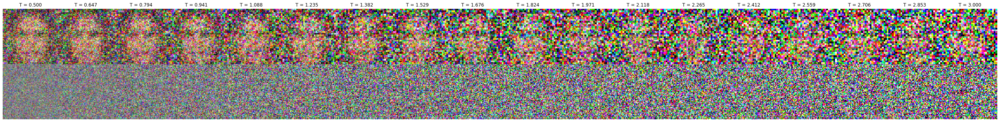

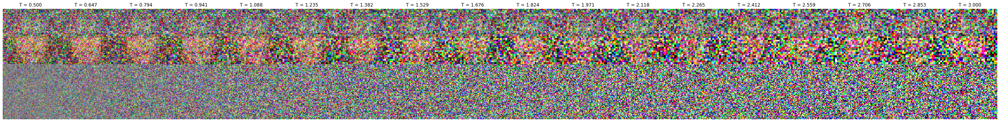

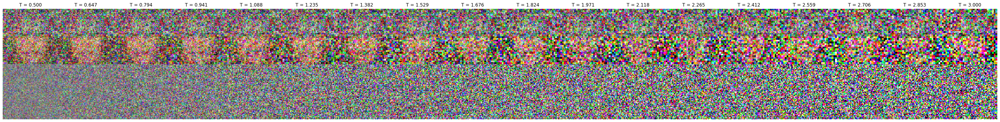

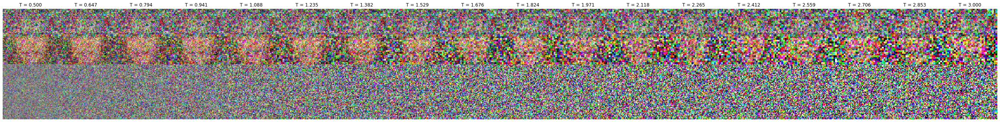

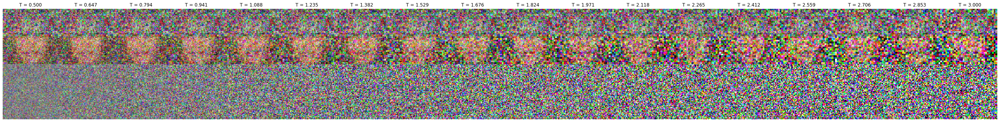

...

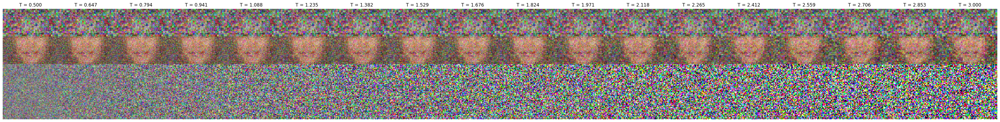

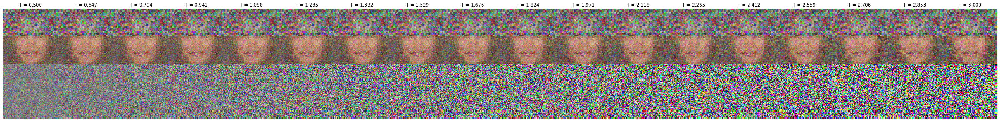

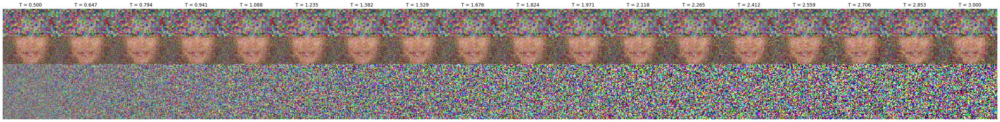

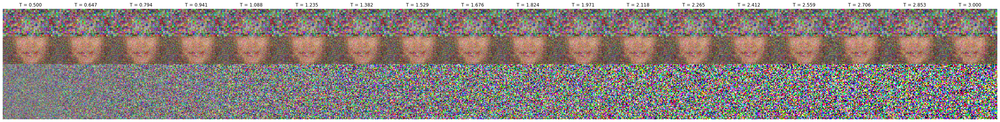

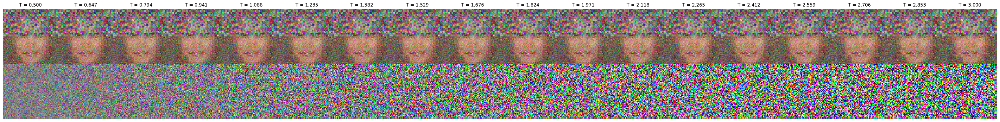

KeyboardInterrupt: 

In [73]:
batch_size = 32
n_pretrain_steps = 500
pretraining = False

jitted_nif_inverse = jit(nif_model.inverse)
jitted_nf_inverse = jit(nf_model.inverse)
# jitted_nif_inverse = nif_model.inverse
# jitted_nf_inverse = nf_model.inverse

pbar = tnrange(1000000)
for i in pbar:
    index = len(losses_nf) # In case we stop part way
    key, *keys = random.split(key, 3)
    
    # Take the next batch of data and random keys
    batch_idx = random.randint(keys[0], (n_gpus, batch_size), minval=0, maxval=x_train.shape[0])
    x_batch = x_train[batch_idx,:]
    train_keys = np.array(random.split(keys[1], n_gpus))
    replicated_i = np.ones(n_gpus)*index
    
    replicated_val_nf, replicated_state_nf, replicated_opt_state_nf = filled_spmd_update_nf(replicated_i, replicated_opt_state_nf, replicated_state_nf, x_batch, train_keys)
    replicated_val_nif, replicated_state_nif, replicated_opt_state_nif = filled_spmd_update_nif(replicated_i, replicated_opt_state_nif, replicated_state_nif, x_batch, train_keys)
    
    # Convert to bits/dimension
    val_nf, val_nif = replicated_val_nf[0], replicated_val_nif[0]
    val_nf, val_nif = val_nf/np.prod(x_train.shape[1:])/np.log(2), val_nif/np.prod(x_train.shape[1:])/np.log(2)

    losses_nf.append(val_nf)
    losses_nif.append(val_nif)
    pbar.set_description('Negative Log Likelihood: NF: %5.3f, NIF: %5.3f'%(val_nf, val_nif)) 
        
    # Check if we're done pretraining
    if(pretraining == True and index > n_pretrain_steps):
        # Get the trained parameters and the state
        opt_state_nf, opt_state_nif = tree_map(lambda x:x[0], replicated_opt_state_nf), tree_map(lambda x:x[0], replicated_opt_state_nif)
        state_nf, state_nif = tree_map(lambda x:x[0], replicated_state_nf), tree_map(lambda x:x[0], replicated_state_nif)
        
        # Get the full parameters
        nif_subparams = get_params(opt_state_nif)
        nif_params = nif_pretrain_swap(nif_subparams)
        
        nf_subparams = get_params(opt_state_nf)
        nf_params = nf_pretrain_swap(nf_subparams)
        
        nif_params, nif_pretrain_swap = pretrainer(nif_model.names, nif_params, nif_model.state, None)
        nf_params, nf_pretrain_swap = pretrainer(nf_model.names, nf_params, nf_model.state, None)

        # Create new models
        nif_model = Model(nif_model.names, nif_model.output_shape, nif_params, nif_model.state, nif_model.forward, nif_model.inverse)
        nf_model = Model(nf_model.names, nf_model.output_shape, nf_params, nf_model.state, nf_model.forward, nf_model.inverse)
        
        # Create the new optimizers
        opt_state_nif, _, filled_spmd_update_nif, replicated_opt_state_nif, replicated_state_nif = create_initializer(nif_model, nif_pretrain_swap, n_gpus)
        opt_state_nf, get_params, filled_spmd_update_nf, replicated_opt_state_nf, replicated_state_nf = create_initializer(nf_model, nf_pretrain_swap, n_gpus)
        pretraining = False
        
    if(index%500 == 0):
        # Get the trained parameters and the state
        opt_state_nf, opt_state_nif = tree_map(lambda x:x[0], replicated_opt_state_nf), tree_map(lambda x:x[0], replicated_opt_state_nif)
        state_nf, state_nif = tree_map(lambda x:x[0], replicated_state_nf), tree_map(lambda x:x[0], replicated_state_nif)
        
        # Get the full parameters
        nif_subparams = get_params(opt_state_nif)
        nif_params = nif_pretrain_swap(nif_subparams)
        
        nf_subparams = get_params(opt_state_nf)
        nf_params = nf_pretrain_swap(nf_subparams)
        
        # Create new models
        nif_model = Model(nif_model.names, nif_model.output_shape, nif_params, state_nif, nif_model.forward, nif_model.inverse)
        nf_model = Model(nf_model.names, nf_model.output_shape, nf_params, state_nf, nf_model.forward, nf_model.inverse)
        
        # Pull noise samples
        n_samples = 18
        n_samples_per_batch = 2
        eval_key = random.PRNGKey(0)
        temperatures = np.linspace(0.5, 3.0, n_samples)
        
        # Create the axes
        n_cols = n_samples
        n_rows = 2

        # Make the subplots
        fig, axes = plt.subplots(n_rows, n_cols); axes = axes.ravel()
        axes_iter = iter(axes)
        fig.set_size_inches(2*n_cols, 2*n_rows)

        # Generate the samples from the noisy injective flow
        zs = random.normal(eval_key, (n_samples, z_dim))
        zs *= temperatures[:,None]
        temp_iter = iter(temperatures)
        
        for j in range(n_samples//n_samples_per_batch):
            z = zs[j*n_samples_per_batch:(j + 1)*n_samples_per_batch]
            _, fz, _ = jitted_nif_inverse(nif_model.params, nif_model.state, np.zeros(n_samples_per_batch), z, (), key=eval_key, test=TEST)
            fz /= (2.0**quantize_level_bits) # Put the image (mostly) between 0 and 1
            fz *= (1.0 - 2*0.05)
            fz += 0.05

            for k in range(n_samples_per_batch):
                ax = next(axes_iter)
                ax.imshow(fz[k])
                ax.set_title('T = %5.3f'%(next(temp_iter)))
                ax.set_axis_off()
                
        # Generate the samples from the normalizing flow
        zs = random.normal(eval_key, (n_samples,) + x_train.shape[1:])
        zs *= temperatures[:,None,None,None]
        temp_iter = iter(temperatures)
                
        for j in range(n_samples//n_samples_per_batch):
            z = zs[j*n_samples_per_batch:(j + 1)*n_samples_per_batch]
            _, fz, _ = jitted_nf_inverse(nf_model.params, nf_model.state, np.zeros(n_samples_per_batch), z, (), key=eval_key, test=TEST)
            fz /= (2.0**quantize_level_bits) # Put the image (mostly) between 0 and 1
            fz *= (1.0 - 2*0.05)
            fz += 0.05

            for k in range(n_samples_per_batch):
                ax = next(axes_iter)
                ax.imshow(fz[k])
                ax.set_axis_off()
                
        plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
        plt.show()
        
    if(False and index%500 == 0):
        # Compute the fid scores
        nif_fid_score, nf_fid_score = get_fid_score(nf_model, nif_model, key, n_samples=1000, n_samples_per_batch=128)
        fids_nif.append(nif_fid_score)
        fids_nf.append(nf_fid_score)

In [ ]:
names

In [ ]:
spp.get_param('upsample', nif_model.names, nif_model.params)

In [ ]:
help(spp.get_param)

# Plot the latent state

In [ ]:
n_samples = 10000
n_samples_per_batch = 128
key = random.PRNGKey(0)

# Make the subplots
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(10, 10)

z_samples = []

for j in tnrange(n_samples//n_samples_per_batch):
    key, *keys = random.split(key, 2)
    batch_idx = random.randint(keys[0], (n_samples_per_batch,), minval=0, maxval=x_train.shape[0])
    _x = x_train[batch_idx,...]

    log_px, finvx, _ = jit(nif_model.forward)(nif_model.params, nif_model.state, np.zeros(n_samples_per_batch), _x, (), test=TEST)
    z_samples.append(finvx)
    
z_samples = np.concatenate(z_samples)
mean= np.mean(z_samples)
std = np.std(z_samples)
print('mean', mean, 'std', std)

colors = np.nonzero(y_test)[1][:z_samples.shape[0]]
scatter = ax.scatter(z_samples[:,0], z_samples[:,1], s=2, c=colors, cmap='Spectral', alpha=0.8)

cbar = fig.colorbar(scatter, boundaries=np.arange(11) - 0.5)
cbar.set_ticks(np.arange(10))

# Check the losses

In [ ]:
fig, axes = plt.subplots(1, 2)
fig.set_size_inches(20, 10)
# axes[0].plot(pd.DataFrame(losses_nf).ewm(alpha=0.1).mean()[500:], label='Normalizing Flow')
axes[0].plot(pd.DataFrame(losses_nif).ewm(alpha=0.1).mean()[3500:], label='Noisy Injective Flow')
axes[0].set_title('Bits/Dimension During Training')
axes[0].set_xlabel('Iterations')
axes[0].set_ylabel('Bits/Dim')
axes[0].legend()

# axes[1].plot(pd.DataFrame(fids_nf).ewm(alpha=0.1).mean(), label='Normalizing Flow')
# axes[1].plot(pd.DataFrame(fids_nif).ewm(alpha=0.1).mean(), label='Noisy Injective Flow')
# axes[1].set_title('FID During Training')
# axes[1].set_xlabel('Iterations')
# axes[1].set_ylabel('FID')
# axes[1].legend()

# Compare samples at the same temperature

In [ ]:
# Get the trained parameters and the state
opt_state_nf, opt_state_nif = tree_map(lambda x:x[0], replicated_opt_state_nf), tree_map(lambda x:x[0], replicated_opt_state_nif)
state_nf, state_nif = tree_map(lambda x:x[0], replicated_state_nf), tree_map(lambda x:x[0], replicated_state_nif)

# Create new models
nf_model = Model(nf_model.names, nf_model.output_shape, get_params(opt_state_nf), state_nf, nf_model.forward, nf_model.inverse)
nif_model = Model(nif_model.names, nif_model.output_shape, get_params(opt_state_nif), state_nif, nif_model.forward, nif_model.inverse)

# Pull noise samples
n_samples = 24
n_samples_per_batch = 2
eval_key = random.PRNGKey(3)
temperatures = np.ones(n_samples)

# Create the axes
n_cols = 8
n_rows = int(np.ceil(2*n_samples/n_cols))

# Make the subplots
fig, axes = plt.subplots(n_rows, n_cols); axes = axes.ravel()
axes_iter = iter(axes)
fig.set_size_inches(2*n_cols, 2*n_rows)

# Generate the samples from the noisy injective flow
zs = random.normal(eval_key, (n_samples, z_dim))
zs *= temperatures[:,None]
temp_iter = iter(temperatures)

for j in range(n_samples//n_samples_per_batch):
    z = zs[j*n_samples_per_batch:(j + 1)*n_samples_per_batch]
    _, fz, _ = nif_model.inverse(nif_model.params, nif_model.state, np.zeros(n_samples_per_batch), z, (), key=eval_key, test=TEST)
    fz /= (2.0**quantize_level_bits) # Put the image (mostly) between 0 and 1
    fz *= (1.0 - 2*0.05)
    fz += 0.05

    for k in range(n_samples_per_batch):
        ax = next(axes_iter)
        ax.imshow(fz[k])
        ax.set_axis_off()

# Generate the samples from the normalizing flow
zs = random.normal(eval_key, (n_samples,) + x_train.shape[1:])
zs *= temperatures[:,None,None,None]
temp_iter = iter(temperatures)

for j in range(n_samples//n_samples_per_batch):
    z = zs[j*n_samples_per_batch:(j + 1)*n_samples_per_batch]
    _, fz, _ = nf_model.inverse(nf_model.params, nf_model.state, np.zeros(n_samples_per_batch), z, (), key=eval_key, test=TEST)
    fz /= (2.0**quantize_level_bits) # Put the image (mostly) between 0 and 1
    fz *= (1.0 - 2*0.05)
    fz += 0.05

    for k in range(n_samples_per_batch):
        ax = next(axes_iter)
        ax.imshow(fz[k])
        ax.set_axis_off()
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)       
plt.show()        

# Compare the samples at different temperatures once more

In [ ]:
# Get the trained parameters and the state
opt_state_nf, opt_state_nif = tree_map(lambda x:x[0], replicated_opt_state_nf), tree_map(lambda x:x[0], replicated_opt_state_nif)
state_nf, state_nif = tree_map(lambda x:x[0], replicated_state_nf), tree_map(lambda x:x[0], replicated_state_nif)

# Create new models
nf_model = Model(nf_model.names, nf_model.output_shape, get_params(opt_state_nf), state_nf, nf_model.forward, nf_model.inverse)
nif_model = Model(nif_model.names, nif_model.output_shape, get_params(opt_state_nif), state_nif, nif_model.forward, nif_model.inverse)

# Pull noise samples
n_samples = 10
n_samples_per_batch = 2
eval_key = random.PRNGKey(3)
temperatures = np.linspace(0.2, 5.0, n_samples)

# Create the axes
n_cols = n_samples
n_rows = 2

# Make the subplots
fig, axes = plt.subplots(n_rows, n_cols); axes = axes.ravel()
axes_iter = iter(axes)
first = True
fig.set_size_inches(2*n_cols, 2*n_rows)

# Generate the samples from the noisy injective flow
zs = random.normal(eval_key, (n_samples, z_dim))
zs *= temperatures[:,None]
temp_iter = iter(temperatures)

for j in range(n_samples//n_samples_per_batch):
    z = zs[j*n_samples_per_batch:(j + 1)*n_samples_per_batch]
    _, fz, _ = nif_model.inverse(nif_model.params, nif_model.state, np.zeros(n_samples_per_batch), z, (), key=eval_key, test=TEST)
    fz /= (2.0**quantize_level_bits) # Put the image (mostly) between 0 and 1
    fz *= (1.0 - 2*0.05)
    fz += 0.05

    for k in range(n_samples_per_batch):
        ax = next(axes_iter)
        if(first):
            ax.set_ylabel('Our Method', fontsize=25)
            first = False
            ax.set_yticklabels([])
            ax.set_xticklabels([])
            ax.tick_params(axis='both', which='both', length=0)
        else:
            ax.set_axis_off()
        ax.imshow(fz[k])
        ax.set_title('T = %5.2f'%(next(temp_iter)), fontsize=20)

# Generate the samples from the normalizing flow
zs = random.normal(eval_key, (n_samples,) + x_train.shape[1:])
zs *= temperatures[:,None,None,None]
temp_iter = iter(temperatures)
first = True

for j in range(n_samples//n_samples_per_batch):
    z = zs[j*n_samples_per_batch:(j + 1)*n_samples_per_batch]
    _, fz, _ = nf_model.inverse(nf_model.params, nf_model.state, np.zeros(n_samples_per_batch), z, (), key=eval_key, test=TEST)
    fz /= (2.0**quantize_level_bits) # Put the image (mostly) between 0 and 1
    fz *= (1.0 - 2*0.05)
    fz += 0.05

    for k in range(n_samples_per_batch):
        ax = next(axes_iter)
        if(first):
            ax.set_ylabel('GLOW', fontsize=25)
            first = False    
            ax.set_yticklabels([])
            ax.set_xticklabels([])
            ax.tick_params(axis='both', which='both', length=0)
        else:
            ax.set_axis_off()
        ax.imshow(fz[k])
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)       
plt.show()        

# Look at the reconstructions

In [ ]:
n_samples = 10
n_samples_per_batch = 2
key = random.PRNGKey(0)

# Create the axes
n_cols = n_samples
n_rows = 2

# Make the subplots
fig, axes = plt.subplots(n_rows, n_cols)#; axes = axes.ravel()
axes_iter = iter(axes)
fig.set_size_inches(2*n_cols, 2*n_rows)

for j in range(n_samples//n_samples_per_batch):
    key, *keys = random.split(key, 2)
    batch_idx = random.randint(keys[0], (n_samples_per_batch,), minval=0, maxval=x_train.shape[0])
    _x = x_train[batch_idx,...]

    log_px, finvx, _ = nif_model.forward(nif_model.params, nif_model.state, np.zeros(n_samples_per_batch), _x, (), test=TEST)
    _, fz, _ = nif_model.inverse(nif_model.params, nif_model.state, np.zeros(n_samples_per_batch), finvx, (), test=TEST)
    fz /= (2.0**quantize_level_bits)
    fz *= (1.0 - 2*0.05)
    fz += 0.05

    for i in range(n_samples_per_batch):
        axes[0,j*n_samples_per_batch + i].imshow(fz[i])
        axes[1,j*n_samples_per_batch + i].imshow(_x[i]/(2.0**quantize_level_bits))
        axes[0,j*n_samples_per_batch + i].set_axis_off()
        axes[1,j*n_samples_per_batch + i].set_axis_off()
        
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)        
plt.show()

# Pull a bunch of samples

In [ ]:
# Pull noise samples
n_samples = 180
n_samples_per_batch = 60
eval_key = key # random.PRNGKey(0)
zs = random.normal(eval_key, (n_samples, z_dim))*1.0

# Create the axes
n_cols = 20
n_rows = int(np.ceil(n_samples/n_cols))

# Make the subplots
fig, axes = plt.subplots(n_rows, n_cols); axes = axes.ravel()
axes_iter = iter(axes)
fig.set_size_inches(n_cols, n_rows)

# Generate the samples
for j in range(n_samples//n_samples_per_batch):
    z = zs[j*n_samples_per_batch:(j + 1)*n_samples_per_batch]
    _, fz, _ = nif_model.inverse(nif_model.params, nif_model.state, np.zeros(n_samples_per_batch), z, (), test=TEST, key=key)
    fz /= (2.0**quantize_level_bits) # Put the image (mostly) between 0 and 1
    fz *= (1.0 - 2*0.05)
    fz += 0.05

    for k in range(n_samples_per_batch):
        ax = next(axes_iter)
        ax.set_axis_off()
        ax.imshow(fz[k])
        
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.show()

In [ ]:
# Pull noise samples
n_samples = 180
n_samples_per_batch = 60
eval_key = key # random.PRNGKey(0)
zs = random.normal(eval_key, (n_samples, z_dim))*5.0

# Create the axes
n_cols = 20
n_rows = int(np.ceil(n_samples/n_cols))

# Make the subplots
fig, axes = plt.subplots(n_rows, n_cols); axes = axes.ravel()
axes_iter = iter(axes)
fig.set_size_inches(2*n_cols, 2*n_rows)

# Generate the samples
for j in range(n_samples//n_samples_per_batch):
    z = zs[j*n_samples_per_batch:(j + 1)*n_samples_per_batch]
    _, fz, _ = nif_model.inverse(nif_model.params, nif_model.state, np.zeros(n_samples_per_batch), z, (), test=TEST, key=key)
    fz /= (2.0**quantize_level_bits) # Put the image (mostly) between 0 and 1
    fz *= (1.0 - 2*0.05)
    fz += 0.05

    for k in range(n_samples_per_batch):
        ax = next(axes_iter)
        ax.imshow(fz[k])
        ax.set_axis_off()
        
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.show()

In [ ]:
# Pull noise samples
n_samples = 180
n_samples_per_batch = 60
eval_key = key # random.PRNGKey(0)
zs = random.normal(eval_key, (n_samples, z_dim))*10.0

# Create the axes
n_cols = 20
n_rows = int(np.ceil(n_samples/n_cols))

# Make the subplots
fig, axes = plt.subplots(n_rows, n_cols); axes = axes.ravel()
axes_iter = iter(axes)
fig.set_size_inches(2*n_cols, 2*n_rows)

# Generate the samples
for j in range(n_samples//n_samples_per_batch):
    z = zs[j*n_samples_per_batch:(j + 1)*n_samples_per_batch]
    _, fz, _ = nif_model.inverse(nif_model.params, nif_model.state, np.zeros(n_samples_per_batch), z, (), test=TEST, key=key)
    fz /= (2.0**quantize_level_bits) # Put the image (mostly) between 0 and 1
    fz *= (1.0 - 2*0.05)
    fz += 0.05

    for k in range(n_samples_per_batch):
        ax = next(axes_iter)
        ax.imshow(fz[k])
        ax.set_axis_off()
        
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.show()

In [ ]:
# Pull noise samples
n_samples = 180
n_samples_per_batch = 60
eval_key = key # random.PRNGKey(0)
zs = random.normal(eval_key, (n_samples,) + x_train.shape[1:])*5.0

# Create the axes
n_cols = 20
n_rows = int(np.ceil(n_samples/n_cols))

# Make the subplots
fig, axes = plt.subplots(n_rows, n_cols); axes = axes.ravel()
axes_iter = iter(axes)
fig.set_size_inches(2*n_cols, 2*n_rows)

# Generate the samples
for j in range(n_samples//n_samples_per_batch):
    z = zs[j*n_samples_per_batch:(j + 1)*n_samples_per_batch]
    _, fz, _ = nf_model.inverse(nf_model.params, nf_model.state, np.zeros(n_samples_per_batch), z, (), test=TEST, key=key)
    fz /= (2.0**quantize_level_bits) # Put the image (mostly) between 0 and 1
    fz *= (1.0 - 2*0.05)
    fz += 0.05

    for k in range(n_samples_per_batch):
        ax = next(axes_iter)
        ax.imshow(fz[k])
        ax.set_axis_off()

plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.show()

# Interpolate images

In [ ]:
def interpolate_pairs(index_pairs, n_points=20):
    
    n_cols = n_points
    n_rows = len(index_pairs)

    fig, axes = plt.subplots(n_rows, n_cols)
    fig.set_size_inches(2*n_cols, 2*n_rows)
    
    for i, (idx1, idx2) in enumerate(index_pairs):
        x = x_train[[idx1, idx2]]
        _, finvx, _ = nif_model.forward(nif_model.params, nif_model.state, np.zeros(2), x, (), test=TEST, key=key)
        finvx1, finvx2 = finvx
        interpolation_z = np.linspace(finvx1, finvx2, n_points)
        _, fz, _ = nif_model.inverse(nif_model.params, nif_model.state, np.zeros(n_points), interpolation_z, (), test=TEST)
        fz /= (2.0**quantize_level_bits)
        fz *= (1.0 - 2*0.05)
        fz += 0.05
        for j in range(n_points):
            axes[i,j].imshow(fz[j])
            axes[i,j].set_axis_off()
            
    plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
    plt.show()

In [ ]:
n_pairs = 30
random_pairs = random.randint(key, (2*n_pairs,), minval=0, maxval=x_train.shape[0])
pairs_iter = iter(random_pairs)
image_pairs = [(next(pairs_iter), next(pairs_iter)) for _ in range(n_pairs)]
interpolate_pairs(image_pairs)

# See how seperable the test set is with the different embeddings

In [ ]:
import umap
_, _, x_test, y_test = get_cifar10_data(quantize_level_bits=3)
x_test = x_test/(2**3)*(2**3)

# Create the training embeddings

In [ ]:
x_train.shape

In [ ]:
n_samples = 50000
n_samples_per_batch = 128
key = random.PRNGKey(0)

train_nif_embeddings, train_nf_embeddings = [], []
train_nif_log_px, train_nf_log_px = [], []

for j in tnrange(n_samples//n_samples_per_batch):
    key, *keys = random.split(key, 2)
    _x = x_train[n_samples_per_batch*j:n_samples_per_batch*(j + 1)]

    log_px_nif, finvx_nif, _ = jit(nif_model.forward)(nif_model.params, nif_model.state, np.zeros(n_samples_per_batch), _x, (), key=None)
    log_px_nf, finvx_nf, _ = jit(nf_model.forward)(nf_model.params, nf_model.state, np.zeros(n_samples_per_batch), _x, (), key=None)
    
    train_nif_log_px.append(log_px_nif)
    train_nf_log_px.append(log_px_nf)
    
    train_nif_embeddings.append(finvx_nif)
    train_nf_embeddings.append(finvx_nf)
    
train_nif_log_px = np.concatenate(train_nif_log_px)/np.prod(x_train.shape[1:])/np.log(2)
train_nf_log_px = np.concatenate(train_nf_log_px)/np.prod(x_train.shape[1:])/np.log(2)

train_nif_embeddings = np.concatenate(train_nif_embeddings)
train_nf_embeddings = np.concatenate(train_nf_embeddings)

# Create the test embeddings

In [ ]:
n_samples = 10000
n_samples_per_batch = 128
key = random.PRNGKey(0)

test_nif_embeddings, test_nf_embeddings = [], []
test_nif_log_px, test_nf_log_px = [], []

for j in tnrange(n_samples//n_samples_per_batch):
    key, *keys = random.split(key, 2)
    _x = x_test[n_samples_per_batch*j:n_samples_per_batch*(j + 1)]

    log_px_nif, finvx_nif, _ = jit(nif_model.forward)(nif_model.params, nif_model.state, np.zeros(n_samples_per_batch), _x, (), key=None)
    log_px_nf, finvx_nf, _ = jit(nf_model.forward)(nf_model.params, nf_model.state, np.zeros(n_samples_per_batch), _x, (), key=None)
    
    test_nif_log_px.append(log_px_nif)
    test_nf_log_px.append(log_px_nf)
    
    test_nif_embeddings.append(finvx_nif)
    test_nf_embeddings.append(finvx_nf)
    
test_nif_log_px = np.concatenate(test_nif_log_px)/np.prod(x_train.shape[1:])/np.log(2)
test_nf_log_px = np.concatenate(test_nf_log_px)/np.prod(x_train.shape[1:])/np.log(2)

test_nif_embeddings = np.concatenate(test_nif_embeddings)
test_nf_embeddings = np.concatenate(test_nf_embeddings)

In [ ]:
np.mean(test_nif_log_px), np.mean(test_nf_log_px)

In [ ]:
# y = np.nonzero(y_train)[1][:train_nif_embeddings.shape[0]]
# nif_embedder = umap.UMAP().fit(train_nif_embeddings, y=y)
# nf_embedder = umap.UMAP().fit(train_nf_embeddings, y=y)

In [ ]:
# test_nif_2d_embeddings = nif_embedder.transform(test_nif_embeddings)
# test_nf_2d_embeddings = nf_embedder.transform(test_nf_embeddings)

In [ ]:
y = np.nonzero(y_test)[1][:test_nif_embeddings.shape[0]]
test_nif_2d_embeddings = umap.UMAP().fit_transform(test_nif_embeddings, y=y)
test_nf_2d_embeddings = umap.UMAP().fit_transform(test_nf_embeddings, y=y)

In [ ]:
colors = np.nonzero(y_test)[1][:test_nif_2d_embeddings.shape[0]]

fig, axes = plt.subplots(1, 2, figsize=(40, 20))
axes[0].scatter(test_nif_2d_embeddings[:,0], test_nif_2d_embeddings[:,1], s=7.0, c=colors, cmap='Spectral', alpha=0.8)
scatter = axes[1].scatter(test_nf_2d_embeddings[:,0], test_nf_2d_embeddings[:,1], s=7.0, c=colors, cmap='Spectral', alpha=0.8)

axes[0].set_title('Our Embedding')
axes[1].set_title('GLOW Embedding')

axes[0].xaxis.set_visible(False)
axes[0].yaxis.set_visible(False)
axes[1].xaxis.set_visible(False)
axes[1].yaxis.set_visible(False)

cbar = fig.colorbar(scatter, boundaries=np.arange(11) - 0.5)
cbar.set_ticks(np.arange(10))